In [1]:
!nvidia-smi

Tue Sep 27 20:41:51 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.82.01    Driver Version: 470.82.01    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   41C    P0    30W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
## Install ImageDataAugmentor
!pip install --upgrade albumentations -q
!pip install git+https://github.com/mjkvaak/ImageDataAugmentor -q
#!rm -r ImageDataAugmentor/.git/ #<- To get rid of Kaggle's "Output path contains too many nested subdirectories"-error
!pip install imagesize

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import zipfile
import csv
import sys
import os
import inspect
# import timeit
import time



import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.regularizers import l2
from tensorflow.keras import optimizers
import tensorflow.keras.models as M
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.efficientnet import EfficientNetB7
from tensorflow.keras.applications.densenet import DenseNet169

import tensorflow.keras.backend as K 
from tensorflow.keras.layers import *
from ImageDataAugmentor.image_data_augmentor import *
import albumentations as A
from tqdm import tqdm
from pathlib import Path
import imagesize
from itertools import chain
from skimage import io

from sklearn.model_selection import train_test_split, StratifiedKFold

import PIL
from PIL import ImageOps, ImageFilter, Image
#увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 
%matplotlib inline

print(os.listdir("../input"))
print('Python       :', sys.version.split('\n')[0])
print('Numpy        :', np.__version__)
print('Tensorflow   :', tf.__version__)
print('Keras        :', tf.keras.__version__)

['sf-dl-car-classification', 'model-accuracy']
Python       : 3.7.12 | packaged by conda-forge | (default, Oct 26 2021, 06:08:53) 
Numpy        : 1.21.6
Tensorflow   : 2.6.4
Keras        : 2.6.0


In [4]:
print(A.__version__)


1.2.1


**Работаем с Tensorflow v2**

In [5]:
!pip freeze > requirements.txt

# Основные настройки

In [6]:
# В setup выносим основные настройки: так удобнее их перебирать в дальнейшем.

EPOCHS               = 13  # эпох на обучение
BATCH_SIZE           = 16 # уменьшаем batch если сеть большая, иначе не влезет в память на GPU
LR                   = 1e-4
VAL_SPLIT            = 0.2 # сколько данных выделяем на тест = 15%

CLASS_NUM            = 10  # количество классов в нашей задаче
IMG_SIZE             = 256 # какого размера подаем изображения в сеть
IMG_CHANNELS         = 3   # у RGB 3 канала
input_shape          = (IMG_SIZE, IMG_SIZE, IMG_CHANNELS)

DATA_PATH = '../input/sf-dl-car-classification/'
PATH = "../working/car/" # рабочая директория

In [7]:
# Устаналиваем конкретное значение random seed для воспроизводимости
# os.makedirs(PATH,exist_ok=False)
try:
    os.makedirs(PATH)
except FileExistsError:
    pass

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)  
PYTHONHASHSEED = 0

In [8]:
os.listdir('..')

['src', 'lib', 'input', 'working']

In [9]:
from os import walk
res = []
dirn=[]
dir_path='..'
for (dir_path, dir_names, file_names) in walk(dir_path):
    res.extend(file_names)
    dirn.extend(dir_names)
print(res)
print(dirn)

['script.ipynb', 'gcp.py', 'train.zip', 'sample-submission.csv', 'test.zip', 'train.csv', 'ml_results.ods', '__notebook__.ipynb', 'requirements.txt']
['src', 'lib', 'input', 'working', 'kaggle', 'sf-dl-car-classification', 'model-accuracy', 'car']


# EDA / Анализ данных

In [10]:
train_df = pd.read_csv(DATA_PATH+"train.csv")
sample_submission = pd.read_csv(DATA_PATH+"sample-submission.csv")
train_df.head()

,Id,Category
0,100155.jpg,0
1,100306.jpg,0
2,100379.jpg,0
3,100380.jpg,0
4,100389.jpg,0


In [11]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15561 entries, 0 to 15560
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Id        15561 non-null  object
 1   Category  15561 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 243.3+ KB


In [12]:
train_df.Category.value_counts()
# распределение классов достаточно равномерное - это хорошо

1    1971
8    1765
6    1733
5    1631
0    1613
3    1528
2    1458
4    1400
9    1255
7    1207
Name: Category, dtype: int64

In [13]:
print('Распаковываем картинки')
# Will unzip the files so that you can see them..
for data_zip in ['train.zip', 'test.zip']:
    with zipfile.ZipFile("../input/sf-dl-car-classification/"+data_zip,"r") as z:
        z.extractall(PATH)
        
print(os.listdir(PATH))

Распаковываем картинки
['train', 'test_upload']


Пример картинок (random sample)


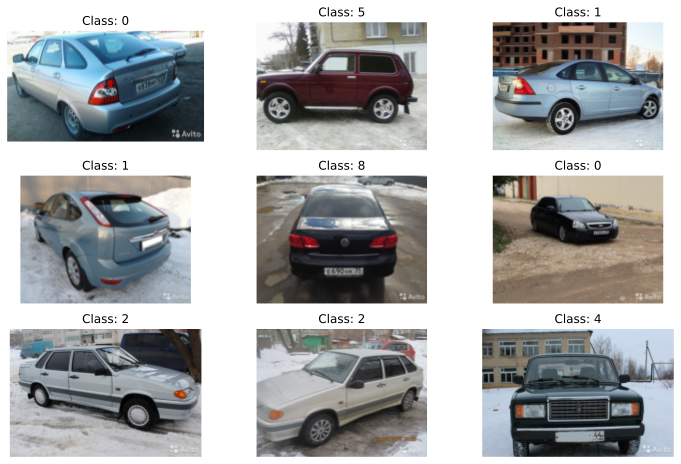

In [14]:
print('Пример картинок (random sample)')
plt.figure(figsize=(12,8))

random_image = train_df.sample(n=9)
random_image_paths = random_image['Id'].values
random_image_cat = random_image['Category'].values

for index, path in enumerate(random_image_paths):
    im = PIL.Image.open(PATH+f'train/{random_image_cat[index]}/{path}')
    plt.subplot(3,3, index+1)
    plt.imshow(im)
    plt.title('Class: '+str(random_image_cat[index]))
    plt.axis('off')
plt.show()

Посмотрим на примеры картинок и их размеры чтоб понимать как их лучше обработать и сжимать.

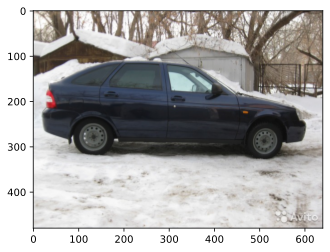

(640, 480)

In [15]:
image = PIL.Image.open(PATH+'/train/0/100380.jpg')
imgplot = plt.imshow(image)
plt.show()
image.size

### Уже догадываетесь, что означают классы?

# Подготовка данных

### Аугментация данных

In [16]:
%config Completer.use_jedi = False
import cv2

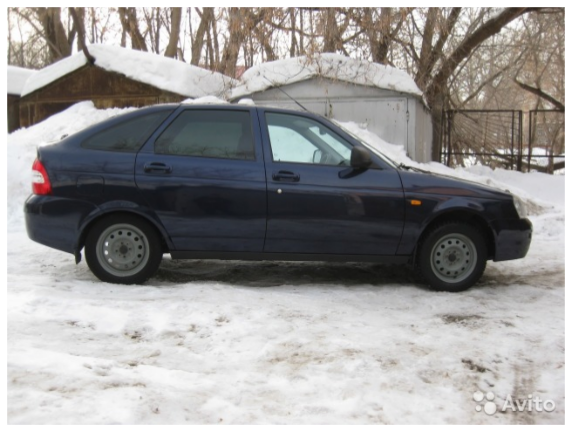

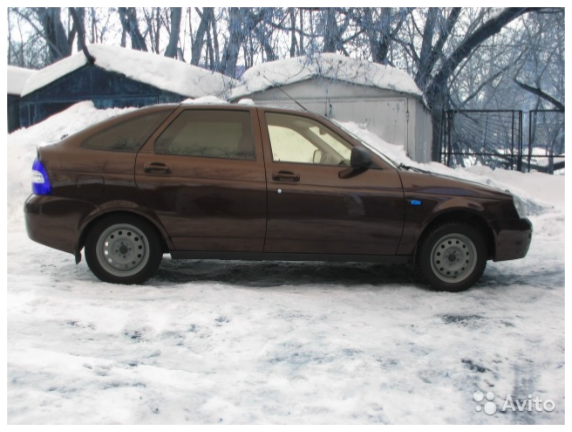

In [17]:
# try to plot changes (albumentations)
def visualize(image):
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)

figure = cv2.imread('../working/car/train/0/100380.jpg', -1)
figure = cv2.cvtColor(figure, cv2.COLOR_BGR2RGB)
visualize(figure)

# plt.imshow(figure)
figure = cv2.cvtColor(figure, cv2.COLOR_BGR2RGB)
# transform = A.HorizontalFlip(p=0.5)
transform = A.Rotate(limit=30, interpolation=1, border_mode=4, value=None, mask_value=None, always_apply=False, p=0.5)
# transform = A.RandomCrop(height=400, width=400)
random.seed(42) 
augmented_image = transform(image=figure)['image']
visualize(augmented_image)

Look at the image size data in order to decide the best sizes

In [18]:
# collect image size data
dir_path = PATH+'/train/'
img_meta = {}
# res = []
for (dir_path, dir_names, file_names) in os.walk(dir_path):
    for img in file_names:
#         print(os.path.join(dir_path,img))
        img_meta[str(img)] =  imagesize.get(os.path.join(dir_path,img)) 

    
img_meta_df = pd.DataFrame.from_dict([img_meta]).T.reset_index().set_axis(['FileName', 'Size'], axis='columns', inplace=False)
img_meta_df[["Width", "Height"]] = pd.DataFrame(img_meta_df["Size"].tolist(), index=img_meta_df.index)
img_meta_df["Aspect Ratio"] = round(img_meta_df["Width"] / img_meta_df["Height"], 2)

print(f'Total Nr of Images in the dataset: {len(img_meta_df)}')
img_meta_df.head()    

Total Nr of Images in the dataset: 15561


,FileName,Size,Width,Height,Aspect Ratio
0,18475.jpg,"(640, 480)",640,480,1.33
1,127249.jpg,"(640, 477)",640,477,1.34
2,179117.jpg,"(640, 480)",640,480,1.33
3,12598.jpg,"(640, 480)",640,480,1.33
4,130437.jpg,"(640, 480)",640,480,1.33


In [19]:
# plot image size data
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
points = ax.scatter(img_meta_df.Width, img_meta_df.Height, color='blue', alpha=0.5, s=img_meta_df["Aspect Ratio"]*100, picker=True)
ax.set_title("Image Resolution")
ax.set_xlabel("Width", size=14)
ax.set_ylabel("Height", size=14)
# plt.xlim([200, 700])
# plt.ylim([200,600])

Text(0, 0.5, 'Height')

different image sizes were tried starting from 512, the best one 256 was selected

In [20]:
# Вы помните, что аугментация данных важна, когда мы работаем с небольшим датасетом. Это как раз наш случай.
# Чтобы лучше понять работу параметров, попробуйте их изменить. К какому результату это приведет?
# Официальная документация: https://keras.io/preprocessing/image/

# 91.28%

# train_datagen = ImageDataGenerator(
#     rescale=1. / 255,
#     rotation_range = 5,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     validation_split=VAL_SPLIT, # set validation split
#     horizontal_flip=False)

# test_datagen = ImageDataGenerator(rescale=1. / 255)

#Рекомендация Подключите более продвинутые библиотеки аугментации изображений (например: albumentations или imgaug, для них есть специальные "обертки" под Keras, например: https://github.com/mjkvaak/ImageDataAugmentor)

In [21]:
# best augmentation was selected

AUGMENTATIONS = A.Compose([
    A.HorizontalFlip(p=0.5),# Rotate the image horizontally around the y-axis.
    A.Rotate(limit=30, interpolation=1, border_mode=4, value=None, mask_value=None, always_apply=False, p=0.5),# Rotate by an angle randomly chosen from a uniform distribution.
    A.OneOf([
        A.CenterCrop(height=220, width=200),# Cutting the center.
        A.CenterCrop(height=200, width=220),
    ],p=0.5),
    A.OneOf([
        A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3),# Random replacement of image brightness and contrast.
        A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1)
    ],p=0.5),
    A.GaussianBlur(p=0.05),# Blur an image with a Gaussian filter
    A.HueSaturationValue(p=0.5),# Random replacement of hue, saturation of the image .


    A.RGBShift(p=0.5),# Arbitrary value offset for each channel of RGB input image.

    A.FancyPCA(alpha=0.1, always_apply=False, p=0.5), # Enlarging an RGB image with FancyPCA 
    A.Resize(IMG_SIZE, IMG_SIZE)# Size changing according to the selected height & width.
])


In [22]:
train_datagen = ImageDataAugmentor(rescale = 1. / 255,
                                   augment = AUGMENTATIONS,
                                   validation_split=VAL_SPLIT,
                                   seed = RANDOM_SEED )
test_datagen = ImageDataAugmentor(rescale = 1. / 255,
                                  seed = RANDOM_SEED)

### Генерация данных

data generation for cycle of models in order to select the best model <br>
seems like some models need special sizes

In [23]:
# # BATCH_SIZE = 16
# IMG_SIZE = 224
# train_generator_224 = train_datagen.flow_from_directory(
#     PATH+'train/',      # директория где расположены папки с картинками 
#     target_size=(IMG_SIZE, IMG_SIZE),
#     batch_size=BATCH_SIZE,
#     class_mode='categorical',
#     shuffle=True, seed=RANDOM_SEED,
#     subset='training') # set as training data

# test_generator_224 = train_datagen.flow_from_directory(
#     PATH+'train/',
#     target_size=(IMG_SIZE, IMG_SIZE),
#     batch_size=BATCH_SIZE,
#     class_mode='categorical',
#     shuffle=True, seed=RANDOM_SEED,
#     subset='validation') # set as validation data


In [24]:
# IMG_SIZE = 331
# train_generator_331 = train_datagen.flow_from_directory(
#     PATH+'train/',      # директория где расположены папки с картинками 
#     target_size=(IMG_SIZE, IMG_SIZE),
#     batch_size=BATCH_SIZE,
#     class_mode='categorical',
#     shuffle=True, seed=RANDOM_SEED,
#     subset='training') # set as training data

# test_generator_331 = train_datagen.flow_from_directory(
#     PATH+'train/',
#     target_size=(IMG_SIZE, IMG_SIZE),
#     batch_size=BATCH_SIZE,
#     class_mode='categorical',
#     shuffle=True, seed=RANDOM_SEED,
#     subset='validation') 

In [25]:
# Завернем наши данные в генератор:

train_generator = train_datagen.flow_from_directory(
    PATH+'train/',      # директория где расположены папки с картинками 
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True, seed=RANDOM_SEED,
    subset='training') # set as training data

test_generator = train_datagen.flow_from_directory(
    PATH+'train/',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True, seed=RANDOM_SEED,
    subset='validation') # set as validation data

test_sub_generator = test_datagen.flow_from_dataframe( 
    dataframe=sample_submission,
    directory=PATH+'test_upload/',
    x_col="Id",
    y_col=None,
    shuffle=False,
    class_mode=None,
    seed=RANDOM_SEED,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,)

# Обратите внимание, что для сабмита мы используем другой источник test_datagen.flow_from_dataframe. Как вы думаете, почему?

/opt/conda/lib/python3.7/site-packages/ImageDataAugmentor/image_data_augmentor.py:333: UserWarning: Passing `seed` in `.flow_from_directory` has been been removed: pass  `seed` as parameter in `ImageDataAugmentor(..., seed=...)` instead
  warnings.warn('Passing `seed` in `.flow_from_directory` has been been removed: pass  `seed` '


Found 12452 images belonging to 10 classes.
Found 3109 images belonging to 10 classes.
Found 6675 validated image filenames.


/opt/conda/lib/python3.7/site-packages/ImageDataAugmentor/image_data_augmentor.py:456: UserWarning: Passing `seed` in `.flow_from_datagrame` has been been removed: pass  `seed` as parameter in `ImageDataAugmentor(..., seed=...)` instead
  warnings.warn('Passing `seed` in `.flow_from_datagrame` has been been removed: pass  `seed` '


Пример картинок из train_generator


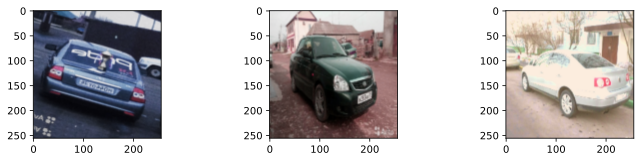

In [26]:
# изображения после аугментации

def imshow(image_RGB):
  io.imshow(image_RGB)
  io.show()

x,y = train_generator.next() # вызываем трейн-генератор
print('Пример картинок из train_generator')
plt.figure(figsize=(12,8))

for i in range(0,3):
    image = x[i]
    plt.subplot(3,3, i+1)
    plt.imshow(image)
    
plt.show()


# Try various models with  transfer learning & fine-tuning (different weight freezing)

In [27]:
# List all available models
# model_dictionary = {m[0]:m[1] for m in inspect.getmembers(tf.keras.applications, inspect.isfunction)}
# print(model_dictionary.keys())

In [28]:
# del model_dictionary[list(model_dictionary.keys())[0]]
# print(model_dictionary.keys())

In [29]:
# len(model_dictionary.keys())

In [30]:
# your_keys = [#'ResNet152V2',
# # 'ResNet50V2',
# # 'ResNet50',
# # 'NASNetLarge',
# # 'VGG16',
# # 'InceptionV3',
# # 'MobileNetV2'
# # 'MobileNet',
# # 'DenseNet169',
# # 'DenseNet201',
# # 'Xception',
# # 'ResNet101V2',
# # 'NASNetMobile',
# # 'VGG19',
# # 'InceptionResNetV2']
# 'EfficientNetB5',
# 'EfficientNetB7']

In [31]:
# filter the best models
# filt_model_dict = { your_key: model_dictionary[your_key] for your_key in your_keys }

In [32]:
# len(filt_model_dict.keys())

In [33]:
# checkpoint = ModelCheckpoint('best_model.hdf5', 
#                              monitor = ['val_accuracy'], 
#                              verbose = 1,
# #                              save_best_only=True,
#                              mode = 'max')
# earlystop = EarlyStopping(monitor = 'val_accuracy',
#                           patience = 4,
#                           restore_best_weights = True)
# reduce_lr = ReduceLROnPlateau(monitor='val_loss',
#                               factor=0.25,
#                               patience=2,
#                               min_lr=0.0000001,
#                               verbose=1,
#                               mode='auto')
# callbacks_list = [checkpoint, earlystop, reduce_lr]
# callbacks_list = [ earlystop, reduce_lr]

In [34]:
# # Loop over each model available in Keras
# model_benchmarks = {'model_name': [], 'num_model_params': [], 'validation_accuracy': [], 'validation_accuracy_1':[], 'time': []}

# for model_name, model in tqdm(filt_model_dict.items()):
#     K.clear_session()
#     # Special handling for "NASNetLarge" since it requires input images with size (331,331)
#     if 'NASNetLarge' in model_name:
#         input_shape=(331,331,3)
#         train_processed = train_generator_331
#         validation_processed = test_generator_331
#     else:
#         input_shape=(224,224,3)
#         train_processed = train_generator_224
#         validation_processed = test_generator_224
        
    
#     # load the pre-trained model and freeze the model weights
#     pre_trained_model = model(weights='imagenet', include_top=False, input_shape=input_shape)
# #     pre_trained_model.trainable = False
    
#     #complete weights defrosting
#     pre_trained_model.trainable = True

#     # Fine-tune from this layer onwards
# #     fine_tune_at = len(pre_trained_model.layers)//2
    
#     # Fine-tune from this layer onwards
# #     fine_tune_at = len(pre_trained_model.layers)//4

#     # Freeze all the layers before the `fine_tune_at` layer
# #     for layer in pre_trained_model.layers[:fine_tune_at]:
# #         layer.trainable =  False
    
    
#     # custom modifications on top of pre-trained model and fit
#     model=M.Sequential()
#     model.add(pre_trained_model)
#     model.add(GlobalAveragePooling2D())
#     model.add(Dense(256, activation='relu'))
# #     model.add(BatchNormalization())
#     model.add(Dropout(0.25))
#     model.add(Dense(CLASS_NUM, activation='softmax'))
    
#     start = time.time()
#     model.compile(loss="categorical_crossentropy", optimizer=optimizers.Adam(lr=LR), metrics=["accuracy"])
#     history = model.fit_generator(
#         train_processed,
#         steps_per_epoch = len(train_processed),
#         validation_data = validation_processed, 
#         validation_steps = len(validation_processed),
#         epochs = EPOCHS,
#         callbacks = callbacks_list
# )

#     stop = time.time()
    
#     # Calculate all relevant metrics
#     model_benchmarks['model_name'].append(model_name)
#     model_benchmarks['num_model_params'].append(pre_trained_model.count_params())
#     model_benchmarks['validation_accuracy'].append(history.history['val_accuracy'][-1])
    
#     model.load_weights('best_model.hdf5')
#     model_benchmarks['validation_accuracy_1'].append(model.evaluate_generator(validation_processed, steps=len(validation_processed), verbose=1)[1]*100)
#     model_benchmarks['time'].append(stop - start)


In [35]:
# Convert Results to DataFrame for easy viewing
# benchmark_df = pd.DataFrame(model_benchmarks)

# sort in ascending order of num_model_params column
# benchmark_df.sort_values(['validation_accuracy_1','time','num_model_params'], inplace=True,  ascending = [False, False, False])

# # write results to csv file
# benchmark_df.to_csv('benchmark_df.csv', index=False)
# benchmark_df

In [36]:
# os.listdir('../working')

In [37]:
# download the data and select the best model
# import os
# os.chdir(r'/kaggle/working')



# from IPython.display import FileLink

# FileLink(r'benchmark_df.csv')

# Model building

### callbacks

In [38]:

checkpoint = ModelCheckpoint('best_model.hdf5', 
                             monitor = ['val_accuracy'], 
                             verbose = 1,
#                              save_best_only=True, for some reason it doesn't work
                             mode = 'max')
earlystop = EarlyStopping(monitor = 'val_accuracy',
                          min_delta = 0.00001,
                          patience = 3,
                          restore_best_weights = True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.25,
                              patience=2,
                              min_lr=0.0000001,
                              verbose=1,
                              mode='auto')
callbacks_list = [checkpoint, earlystop, reduce_lr]

In [39]:
# checkpoint = ModelCheckpoint('best_model.hdf5' , monitor = ['val_accuracy'] , verbose = 1  , mode = 'max')
# callbacks_list = [checkpoint]

# # Рекомендация 1. Добавьте другие функции из https://keras.io/callbacks/
# # Рекомендация 2. Используйте разные техники управления Learning Rate
# # https://towardsdatascience.com/finding-good-learning-rate-and-the-one-cycle-policy-7159fe1db5d6 (eng)
# # http://teleported.in/posts/cyclic-learning-rate/ (eng)

### Model training

In [40]:
K.clear_session()
ml_name = DenseNet169
base_model = ml_name(weights='imagenet', include_top=False, input_shape = input_shape)
start = time.time()

2022-09-27 20:44:07.428518: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-27 20:44:07.557951: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-27 20:44:07.562114: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-09-27 20:44:07.567257: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

51888128/51877672 [==============================] - 1s 0us/step


In [41]:
# base_model.summary()
base_model.trainable = True

In [42]:
model=M.Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D())
model.add(Dense(256, activation='relu'))
# model.add(BatchNormalization())
model.add(Dropout(0.25))
model.add(Dense(CLASS_NUM, activation='softmax'))
model.compile(loss="categorical_crossentropy", optimizer=optimizers.Adam(lr=LR), metrics=["accuracy"])
# model.compile(loss="categorical_crossentropy", optimizer=optimizers.RMSprop(lr=LR), metrics=["accuracy"])

/opt/conda/lib/python3.7/site-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [43]:
# try other head architecture
# 95.79%
# model=M.Sequential()
# model.add(base_model)
# model.add(GlobalAveragePooling2D())
# model.add(BatchNormalization())
# model.add(Dropout(0.5))
# model.add(Dense(1024, activation='relu'))
# model.add(Dense(512, activation='relu'))
# model.add(BatchNormalization())
# model.add(Dropout(0.25))
# model.add(Dense(CLASS_NUM, activation='softmax'))
# model.compile(loss="categorical_crossentropy", optimizer=optimizers.Adam(lr=LR), metrics=["accuracy"])

In [44]:
history = model.fit_generator(
        train_generator,
        steps_per_epoch = len(train_generator),
        validation_data = test_generator, 
        validation_steps = len(test_generator),
        epochs = EPOCHS,
        callbacks = callbacks_list
)


/opt/conda/lib/python3.7/site-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
2022-09-27 20:44:23.489586: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/13


2022-09-27 20:44:42.761402: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


779/779 [==============================] - 292s 340ms/step - loss: 0.6670 - accuracy: 0.7659 - val_loss: 0.3057 - val_accuracy: 0.8874

Epoch 00001: saving model to best_model.hdf5
Epoch 2/13
779/779 [==============================] - 262s 336ms/step - loss: 0.2679 - accuracy: 0.9072 - val_loss: 0.2410 - val_accuracy: 0.9141

Epoch 00002: saving model to best_model.hdf5
Epoch 3/13
779/779 [==============================] - 261s 335ms/step - loss: 0.2126 - accuracy: 0.9250 - val_loss: 0.2213 - val_accuracy: 0.9273

Epoch 00003: saving model to best_model.hdf5
Epoch 4/13
779/779 [==============================] - 263s 337ms/step - loss: 0.1787 - accuracy: 0.9392 - val_loss: 0.1887 - val_accuracy: 0.9357

Epoch 00004: saving model to best_model.hdf5
Epoch 5/13
779/779 [==============================] - 261s 335ms/step - loss: 0.1494 - accuracy: 0.9485 - val_loss: 0.1792 - val_accuracy: 0.9366

Epoch 00005: saving model to best_model.hdf5
Epoch 6/13
779/779 [==============================]

In [45]:
model.summary()


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet169 (Functional)     (None, 8, 8, 1664)        12642880  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1664)              0         
_________________________________________________________________
dense (Dense)                (None, 256)               426240    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                2570      
Total params: 13,071,690
Trainable params: 12,913,290
Non-trainable params: 158,400
_________________________________________________________________


In [46]:
stop = time.time()
stop - start

3542.3367953300476

In [47]:
# сохраним итоговую сеть и подгрузим лучшую итерацию в обучении (best_model)
model.save('../working/model_last.hdf5')
model.load_weights('best_model.hdf5')

In [48]:
scores = model.evaluate_generator(test_generator, steps=len(test_generator), verbose=1)
print("Accuracy: %.2f%%" % (scores[1]*100))

/opt/conda/lib/python3.7/site-packages/keras/engine/training.py:2006: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  warnings.warn('`Model.evaluate_generator` is deprecated and '


195/195 [==============================] - 46s 234ms/step - loss: 0.1260 - accuracy: 0.9624
Accuracy: 96.24%


### look at the accuracy plots

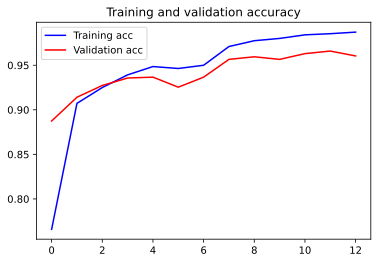

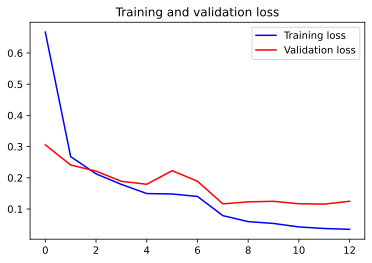

In [49]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
 
plt.figure()
 
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
 
plt.show()

# Предсказание на тестовых данных

In [50]:
test_sub_generator.samples

6675

In [51]:
test_sub_generator.reset()
predictions = model.predict_generator(test_sub_generator, steps=len(test_sub_generator), verbose=1) 
predictions = np.argmax(predictions, axis=-1) #multiple categories
label_map = (train_generator.class_indices)
label_map = dict((v,k) for k,v in label_map.items()) #flip k,v
predictions = [label_map[k] for k in predictions]

/opt/conda/lib/python3.7/site-packages/keras/engine/training.py:2035: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


418/418 [==============================] - 64s 147ms/step


In [52]:
# filenames_with_dir=test_sub_generator.filenames
# submission = pd.DataFrame({'Id':filenames_with_dir, 'Category':predictions}, columns=['Id', 'Category'])
# submission['Id'] = submission['Id'].replace('test_upload/','')
# submission.to_csv('submission.csv', index=False)
# print('Save submit')

# Рекомендация: попробуйте добавить Test Time Augmentation (TTA)
# https://towardsdatascience.com/test-time-augmentation-tta-and-how-to-perform-it-with-keras-4ac19b67fb4d

In [53]:
# submission.head()

## Test Time Augmentation

In [54]:
test_gen = ImageDataAugmentor(rescale=1./255,
                        augment=AUGMENTATIONS, 
                        seed=RANDOM_SEED,
                        validation_split=VAL_SPLIT
                       )

test_sub_generator = test_gen.flow_from_dataframe( 
    dataframe=sample_submission,
    directory=PATH+'test_upload/',
    x_col="Id",
    y_col=None,
    shuffle=False,
    class_mode=None,
    seed=RANDOM_SEED,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,)


Found 6675 validated image filenames.


In [55]:
tta_steps = 10
predictions = []

for i in range(tta_steps):
    preds = model.predict_generator(test_sub_generator, steps=len(test_sub_generator), verbose=1) 
    predictions.append(preds)

pred = np.mean(predictions, axis=0)


418/418 [==============================] - 95s 228ms/step


In [56]:
predictions = np.argmax(pred, axis=-1) #multiple categories
label_map = (train_generator.class_indices)
label_map = dict((v,k) for k,v in label_map.items()) #flip k,v
predictions = [label_map[k] for k in predictions]
filenames_with_dir=test_sub_generator.filenames
submission = pd.DataFrame({'Id':filenames_with_dir, 'Category':predictions}, 
                          columns=['Id', 'Category'])

submission['Id'] = submission['Id'].replace('test_upload/','')

In [57]:
submission.to_csv('submission.csv', index=False)

In [58]:
os.chdir(r'/kaggle/working')



from IPython.display import FileLink

FileLink(r'submission_TTA.csv')

/kaggle/working/submission_TTA.csv

In [59]:
# Clean PATH
import shutil
shutil.rmtree(PATH)

In [60]:
K.clear_session()

# Что можно сделать, чтобы улучшить результат:

* Примените transfer learning с fine-tuning
* Настройте LR, optimizer, loss
* Подберите другие переменные (размер картинки, батч и т.д.)
* Попробуйте и другие архитектуры сетей (а не только Xception) или их ансамбли. Примеры SOTA на ImageNet  
* 
* Добавьте Batch Normalization и поэкспериментируйте с архитектурой “головы”
* Примените другие функции callback Keras https://keras.io/callbacks/ 
* Добавьте TTA (Test Time Augmentation)
* Дополнительно*: Используйте разные техники управления Learning Rate (https://towardsdatascience.com/finding-good-learning-rate-and-the-one-cycle-policy-7159fe1db5d6 (eng) http://teleported.in/posts/cyclic-learning-rate/ (eng))
* Дополнительно*: Добавьте более продвинутые библиотеки аугментации изображений (например, Albumentations )

### Удачи в соревновании!

### Summary

In the project were tried:
* 6 types of augmentation
* different sizes of images starting from 512 to 224
* different number of epochs 
* different batch sizes
* all model types that presents in tf.keras.applications
* fine-tuning and transfer learning
* LR were optimized using ReduceLROnPlateau
* different optimizers 
* Batch Normalization - leads to lower accuracy
* different callback Keras functions
* TTA
* Different head architecture

Could the pearson who will check the result provide some more information about head architecture? How layers should alternate? How much layers should we add? <br>
What loss we could use here, apart from categorical_crossentropy? According to the articles it seems that only categorical_crossentropy should be used in such cases.<br>
Thank you.